In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler




In [2]:

# Load the dataset
df = pd.read_csv("goibibo_com_travel_sample.csv")

# Inspect the dataset
print(df.head())
print(df.info())




                                     additional_info  \
0  Room Service|Internet Access|Restaurant|Free I...   
1                               Room Service|Gym/Spa   
2                           Restaurant|Swimming Pool   
3                                                NaN   
4                         Internet Access|Restaurant   

                                             address            area     city  \
0  15th Mile, N.H.21,Manali, District Kullu,Himac...          Others   Manali   
1  A-585, Sushant Lok-1 ,Near Iffco Chowk Metro S...     Sushant Lok  Gurgaon   
2  Cobra Vaddo,Calungate Baga Road, Bardez, Calan...  Calangute Area      Goa   
3                                              Simsa   Village Simsa   Manali   
4         8180 Street No.-6,Arakashan Road,Paharganj       Paharganj    Delhi   

  country  crawl_date  guest_recommendation hotel_brand hotel_category  \
0   India  2016-07-24                  85.0         NaN        gostays   
1   India  2016-07-24       

In [3]:

df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 36 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   additional_info           3192 non-null   object 
 1   address                   4000 non-null   object 
 2   area                      3965 non-null   object 
 3   city                      4000 non-null   object 
 4   country                   4000 non-null   object 
 5   crawl_date                4000 non-null   object 
 6   guest_recommendation      2416 non-null   float64
 7   hotel_brand               389 non-null    object 
 8   hotel_category            4000 non-null   object 
 9   hotel_description         3983 non-null   object 
 10  hotel_facilities          3806 non-null   object 
 11  hotel_star_rating         4000 non-null   int64  
 12  image_count               4000 non-null   int64  
 13  latitude                  4000 non-null   float64
 14  locality

In [4]:
# Check for missing values
print(df.isnull().sum())

# Replace missing values in numerical columns with the mean
for col in df.select_dtypes(include=['int64', 'float64']):
    df[col] = df[col].fillna(df[col].mean())

# For categorical columns, replace missing values with mode
for col in df.select_dtypes(include=['object']):
    df[col] = df[col].fillna(df[col].mode().iloc[0])


additional_info              808
address                        0
area                          35
city                           0
country                        0
crawl_date                     0
guest_recommendation        1584
hotel_brand                 3611
hotel_category                 0
hotel_description             17
hotel_facilities             194
hotel_star_rating              0
image_count                    0
latitude                       0
locality                      35
longitude                      0
pageurl                        0
point_of_interest            240
property_id                    0
property_name                  0
property_type                  0
province                       0
qts                         1284
query_time_stamp               0
review_count_by_category    1585
room_area                   2872
room_count                     0
room_facilities              270
room_type                      0
similar_hotel                 83
site_revie

In [5]:
# Check for duplicates
duplicates = df.duplicated().sum()
print(f"Number of duplicates: {duplicates}")

# Remove duplicates
cleaned_df = df.drop_duplicates()





Number of duplicates: 0


In [6]:
# Function to detect outliers using IQR
def detect_outliers_IQR(data, column):
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return data[(data[column] < lower_bound) | (data[column] > upper_bound)]

# Detect outliers in numerical columns
for col in cleaned_df.select_dtypes(include=['int64', 'float64']):
    outliers = detect_outliers_IQR(cleaned_df, col)
    print(f"Outliers in {col}: {len(outliers)}")

# Treat outliers by capping values (Ensure each column can hold float values)
for col in cleaned_df.select_dtypes(include=['int64', 'float64']):
    Q1 = cleaned_df[col].quantile(0.25)
    Q3 = cleaned_df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Convert column to float before assigning float values
    cleaned_df[col] = cleaned_df[col].astype(float)  
    
    # Apply capping
    cleaned_df.loc[cleaned_df[col] < lower_bound, col] = lower_bound
    cleaned_df.loc[cleaned_df[col] > upper_bound, col] = upper_bound


Outliers in guest_recommendation: 971
Outliers in hotel_star_rating: 0
Outliers in image_count: 222
Outliers in latitude: 3
Outliers in longitude: 384
Outliers in room_count: 245
Outliers in site_review_count: 310
Outliers in site_review_rating: 1129


In [7]:
# Convert all categorical values to lowercase and strip any whitespace
for col in cleaned_df.select_dtypes(include=['object']):
    cleaned_df[col] = cleaned_df[col].str.lower().str.strip()

# Example: Replace typos in a specific column
# cleaned_df['column_name'].replace({'typo': 'correct_value'}, inplace=True)


In [8]:
print(cleaned_df.head())
print(cleaned_df.info())
print(cleaned_df.describe())


                                     additional_info  \
0  room service|internet access|restaurant|free i...   
1                               room service|gym/spa   
2                           restaurant|swimming pool   
3                                       room service   
4                         internet access|restaurant   

                                             address            area     city  \
0  15th mile, n.h.21,manali, district kullu,himac...          others   manali   
1  a-585, sushant lok-1 ,near iffco chowk metro s...     sushant lok  gurgaon   
2  cobra vaddo,calungate baga road, bardez, calan...  calangute area      goa   
3                                              simsa   village simsa   manali   
4         8180 street no.-6,arakashan road,paharganj       paharganj    delhi   

  country  crawl_date  guest_recommendation    hotel_brand hotel_category  \
0   india  2016-07-24             85.000000  treebo hotels        gostays   
1   india  2016-07-24 

In [9]:
df.info()
df.describe()
df.head()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 36 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   additional_info           4000 non-null   object 
 1   address                   4000 non-null   object 
 2   area                      4000 non-null   object 
 3   city                      4000 non-null   object 
 4   country                   4000 non-null   object 
 5   crawl_date                4000 non-null   object 
 6   guest_recommendation      4000 non-null   float64
 7   hotel_brand               4000 non-null   object 
 8   hotel_category            4000 non-null   object 
 9   hotel_description         4000 non-null   object 
 10  hotel_facilities          4000 non-null   object 
 11  hotel_star_rating         4000 non-null   int64  
 12  image_count               4000 non-null   int64  
 13  latitude                  4000 non-null   float64
 14  locality

,additional_info,address,area,city,country,crawl_date,guest_recommendation,hotel_brand,hotel_category,hotel_description,...,room_count,room_facilities,room_type,similar_hotel,site_review_count,site_review_rating,site_stay_review_rating,sitename,state,uniq_id
0,Room Service|Internet Access|Restaurant|Free I...,"15th Mile, N.H.21,Manali, District Kullu,Himac...",Others,Manali,India,2016-07-24,85.0,Treebo Hotels,gostays,The standard check-in time is 12:00 PM and the...,...,17,Room Service |Basic Bathroom Amenities|Cable /...,Deluxe Room,https://www.goibibo.com/hotels/woodchime-homes...,87.0,4.0,Service Quality::3.9|Amenities::3.7|Food and D...,goibibo,Himachal Pradesh,2c8db027d43a9452a43e88eb30d9f983
1,Room Service|Gym/Spa,"A-585, Sushant Lok-1 ,Near Iffco Chowk Metro S...",Sushant Lok,Gurgaon,India,2016-07-24,87.0,Treebo Hotels,regular,The standard check-in time is 12:00 PM and the...,...,18,Room Service |Air Conditioning |Basic Bathroom...,Deluxe Room With Free WIFI,https://www.goibibo.com/hotels/stepinn-iffco-c...,8.0,4.5,Service Quality::4.7|Amenities::4.7|Food and D...,goibibo,Haryana,e98f69f889c0235e6dc480e7df6de0de
2,Restaurant|Swimming Pool,"Cobra Vaddo,Calungate Baga Road, Bardez, Calan...",Calangute Area,Goa,India,2016-07-24,50.0,Treebo Hotels,regular,The standard check-in time is 12:00 PM and the...,...,15,Room Service |Air Conditioning |Cable / Satell...,Standard Room,https://www.goibibo.com/hotels/sunrise-beach-r...,2.0,2.5,Service Quality::2.5|Amenities::2.5|Food and D...,goibibo,Goa,9b59d00eaffc273d83000ed7dcda0e83
3,Room Service,Simsa,Village Simsa,Manali,India,2016-07-24,100.0,Treebo Hotels,regular,The standard check-in time is 12:00 PM and the...,...,24,Basic Bathroom Amenities|Cable / Satellite / P...,Deluxe Room,https://www.goibibo.com/hotels/green-cottages-...,1.0,5.0,Service Quality::5.0|Amenities::5.0|Food and D...,goibibo,Himachal Pradesh,df0971f9c5501af112485ee28b468ce5
4,Internet Access|Restaurant,"8180 Street No.-6,Arakashan Road,Paharganj",Paharganj,Delhi,India,2016-07-24,63.0,Treebo Hotels,regular,The standard check-in time is 12:00 PM and the...,...,20,Basic Bathroom Amenities|Cable / Satellite / P...,Standard Room Non AC,https://www.goibibo.com/hotels/delhi-continent...,121.0,2.8,Service Quality::2.7|Amenities::2.6|Food and D...,goibibo,Delhi,0c3514344c9cda8718f558e84bdb44ef


In [10]:
# Summary statistics for numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
summary_stats = df[numerical_cols].describe()
print(summary_stats)


       guest_recommendation  hotel_star_rating  image_count     latitude  \
count           4000.000000        4000.000000  4000.000000  4000.000000   
mean              75.537666           1.306000    12.995500    21.288213   
std               17.639584           1.479159    11.631113     7.576905   
min                0.000000           0.000000     0.000000     8.080476   
25%               75.537666           0.000000     6.000000    13.748553   
50%               75.537666           1.000000     9.000000    22.225083   
75%               83.000000           3.000000    17.000000    28.018203   
max              100.000000           5.000000   129.000000    79.608077   

         longitude   room_count  site_review_count  site_review_rating  
count  4000.000000  4000.000000        4000.000000         4000.000000  
mean     77.432995    22.200250          47.765728            3.750993  
std       4.506588    96.132138          72.453076            0.654997  
min      12.939682     

In [11]:
# Frequency distribution for categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    print(f"Frequency distribution for {col}:")
    print(df[col].value_counts())


Frequency distribution for additional_info:
additional_info
Room Service                                                                   1636
Room Service|Internet Access|Restaurant|Free Internet                           299
Room Service|Restaurant                                                         230
Room Service|Internet Access|Restaurant                                         219
Room Service|Free Internet                                                      187
Room Service|Restaurant|Free Internet                                           178
Room Service|Internet Access|Free Internet                                      174
Room Service|Internet Access                                                    171
Room Service|Internet Access|Gym/Spa|Swimming Pool|Restaurant                   101
Restaurant                                                                       83
Internet Access                                                                  55
Room Service|Swi

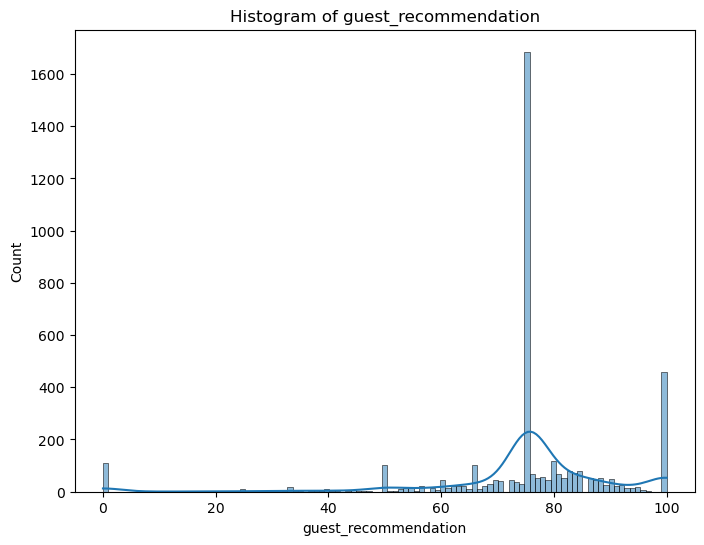

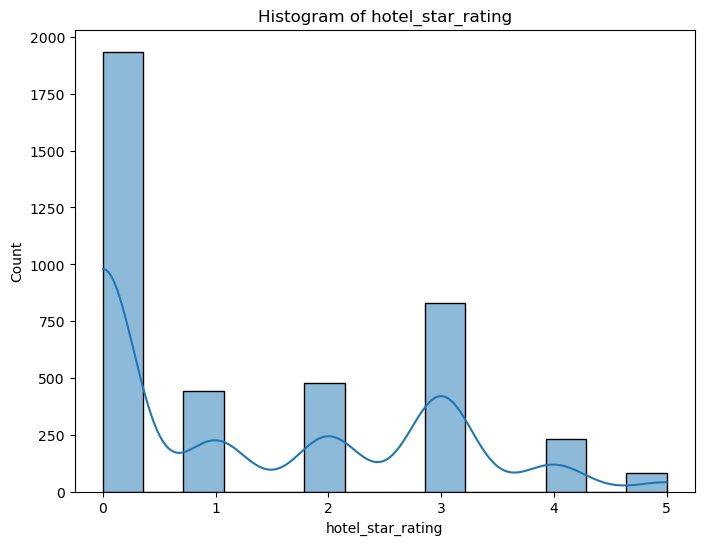

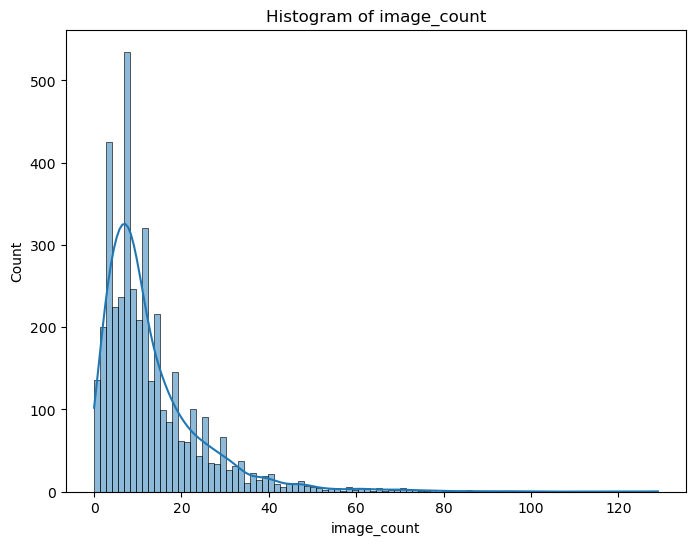

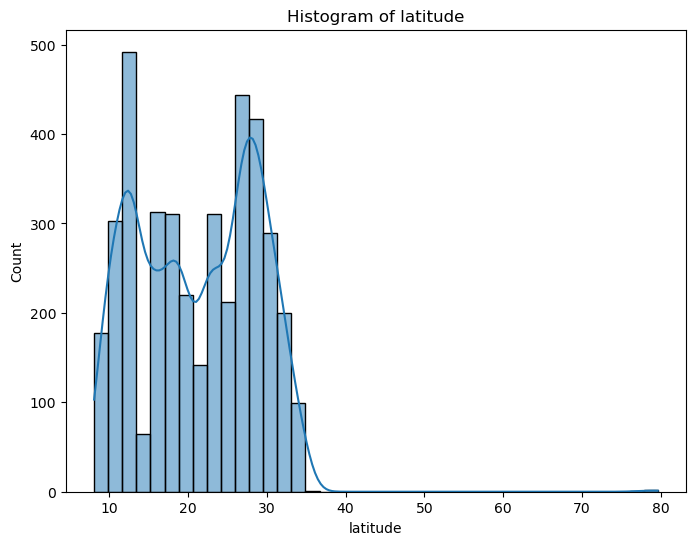

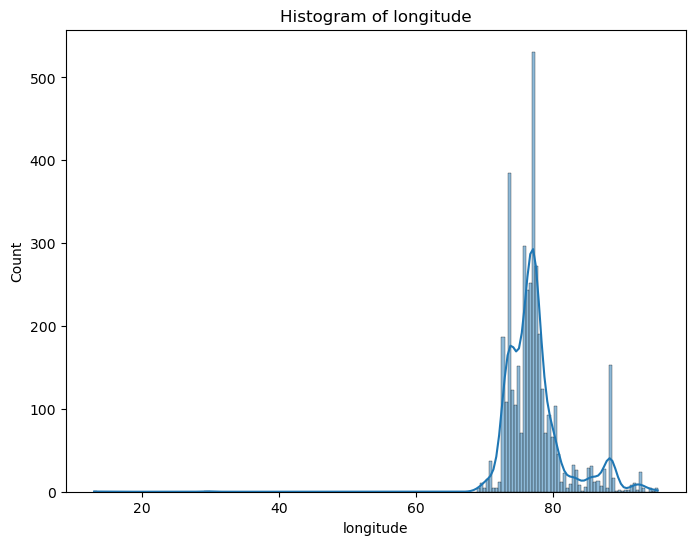

...

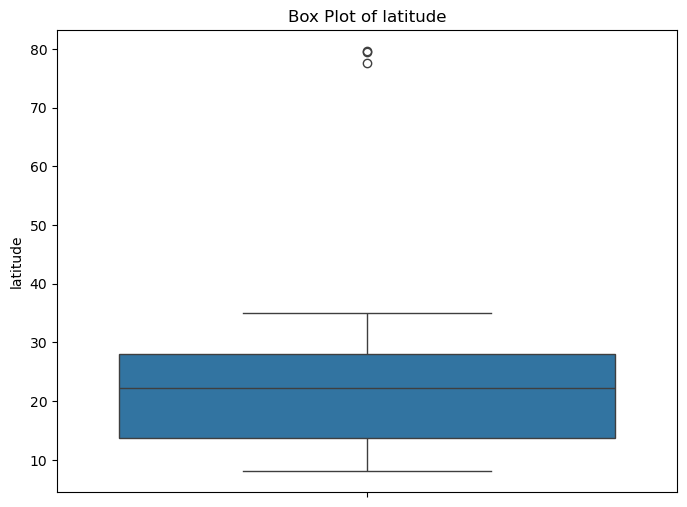

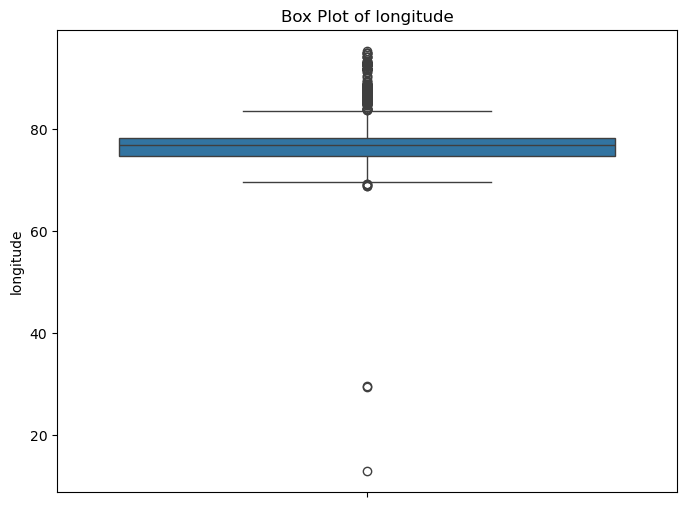

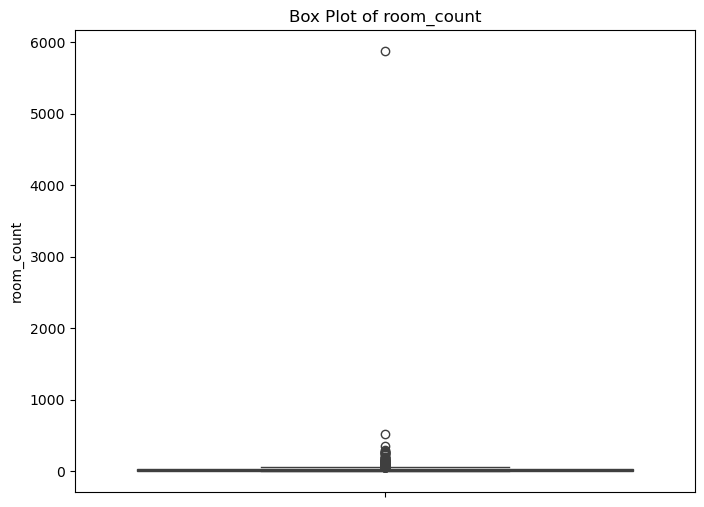

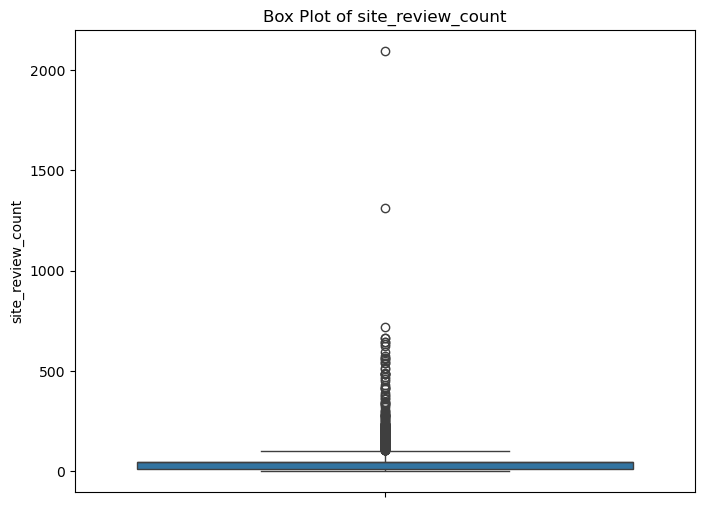

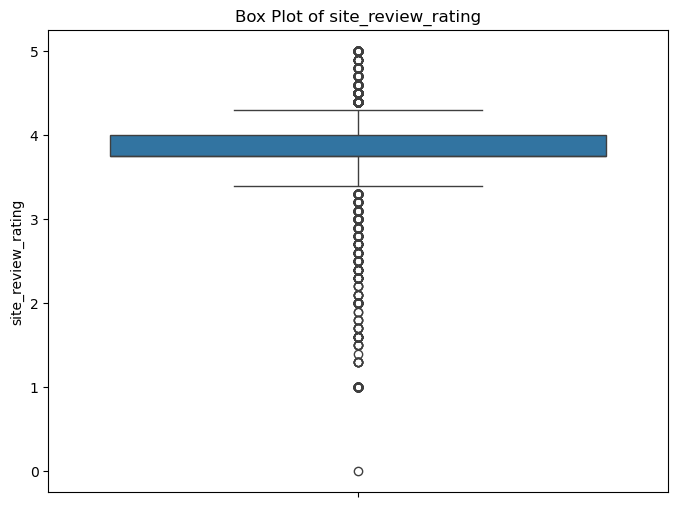

In [12]:
# Histograms for numerical columns
for col in numerical_cols:
    plt.figure(figsize=(8,6))
    sns.histplot(df[col], kde=True)
    plt.title(f"Histogram of {col}")
    plt.show()

# Box plots for numerical columns
for col in numerical_cols:
    plt.figure(figsize=(8,6))
    sns.boxplot(df[col])
    plt.title(f"Box Plot of {col}")
    plt.show()


In [13]:
# Mode for numerical columns
for col in numerical_cols:
    mode = df[col].mode().iloc[0]
    print(f"Mode of {col}: {mode}")

# Skewness for numerical columns
for col in numerical_cols:
    skewness = df[col].skew()
    print(f"Skewness of {col}: {skewness}")


Mode of guest_recommendation: 75.5376655629139
Mode of hotel_star_rating: 0
Mode of image_count: 7
Mode of latitude: 9.4980667
Mode of longitude: 76.3388484
Mode of room_count: 10
Mode of site_review_count: 47.765728476821195
Mode of site_review_rating: 3.7509933774834443
Skewness of guest_recommendation: -2.1334032553628157
Skewness of hotel_star_rating: 0.6573752813458127
Skewness of image_count: 2.3619786261529567
Skewness of latitude: 0.2469297995667891
Skewness of longitude: 0.007922940250984752
Skewness of room_count: 56.54139480189614
Skewness of site_review_count: 10.021022963180764
Skewness of site_review_rating: -1.6589185616454396


       guest_recommendation  hotel_star_rating  image_count     latitude  \
count           2416.000000        4000.000000  4000.000000  4000.000000   
mean              75.537666           1.306000    12.995500    21.288213   
std               22.698935           1.479159    11.631113     7.576905   
min                0.000000           0.000000     0.000000     8.080476   
25%               67.000000           0.000000     6.000000    13.748553   
50%               80.000000           1.000000     9.000000    22.225083   
75%               90.000000           3.000000    17.000000    28.018203   
max              100.000000           5.000000   129.000000    79.608077   

         longitude   room_count  site_review_count  site_review_rating  
count  4000.000000  4000.000000        2416.000000         2416.000000  
mean     77.432995    22.200250          47.765728            3.750993  
std       4.506588    96.132138          93.233924            0.842863  
min      12.939682     

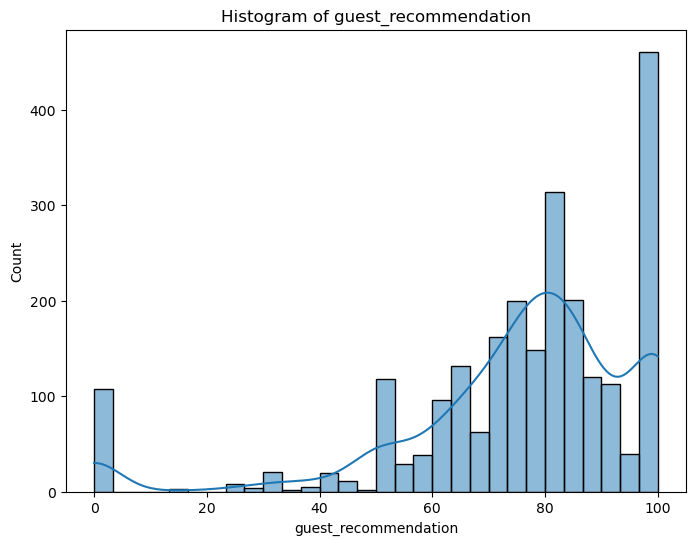

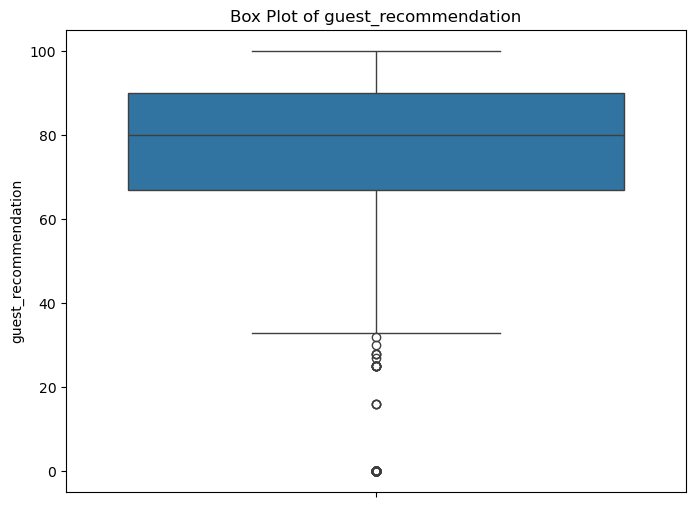

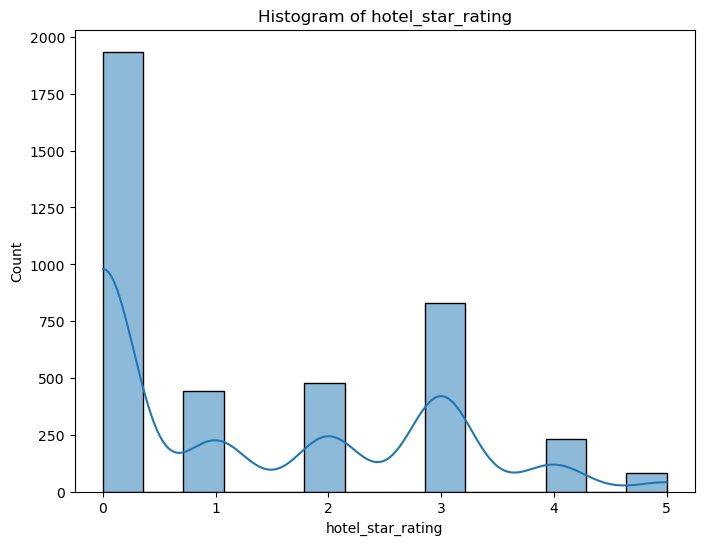

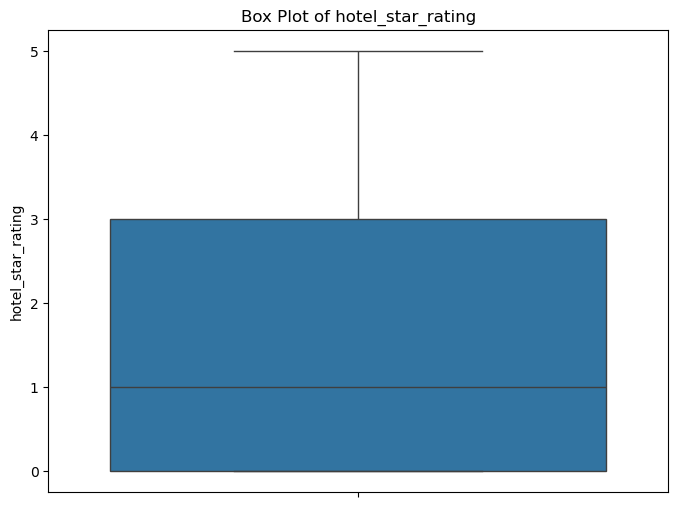

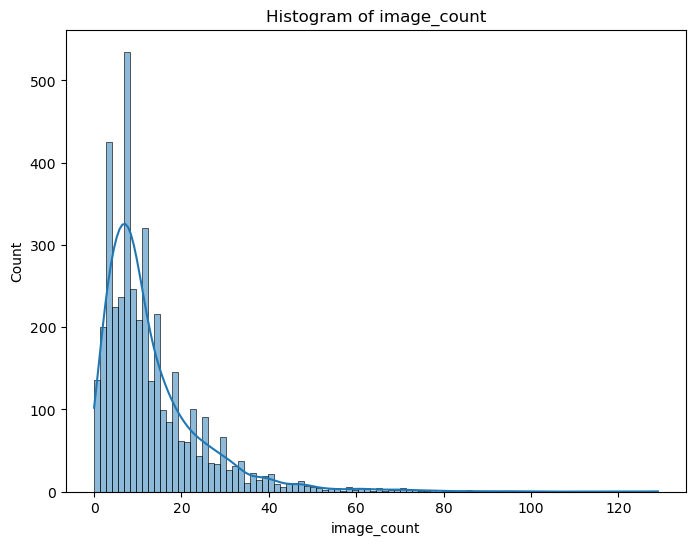

...

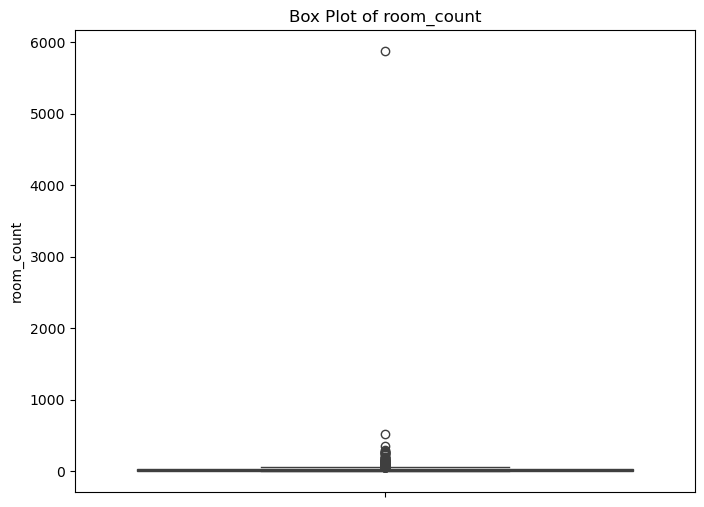

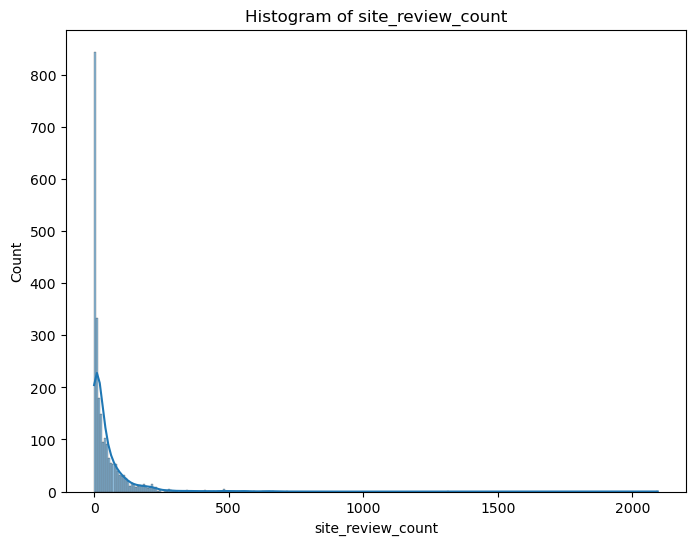

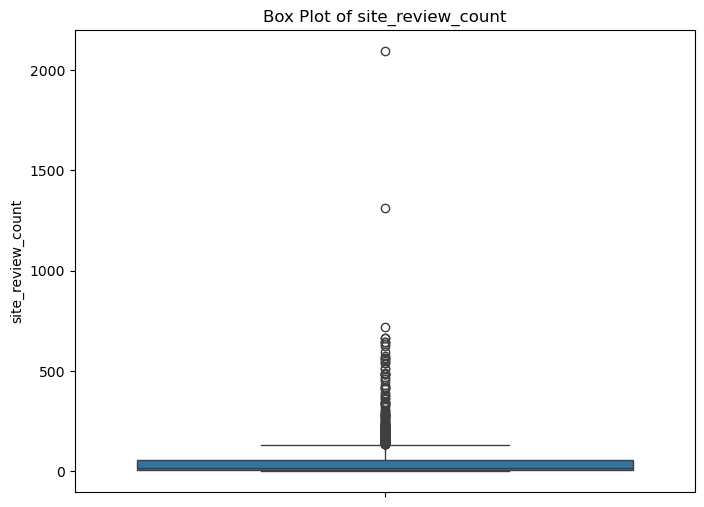

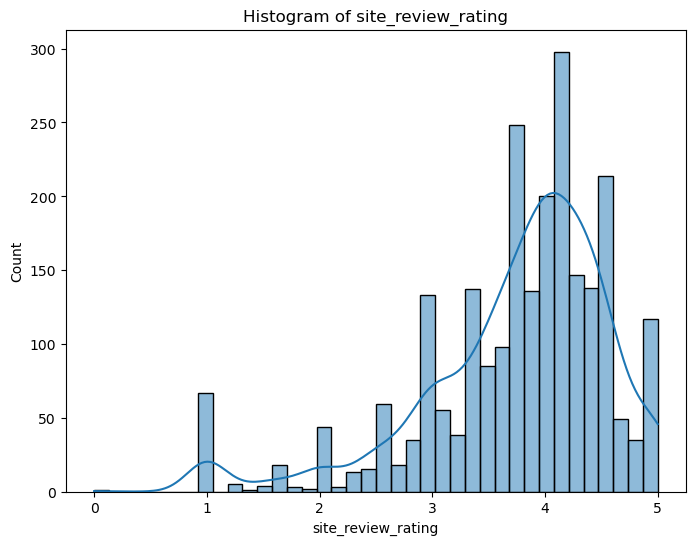

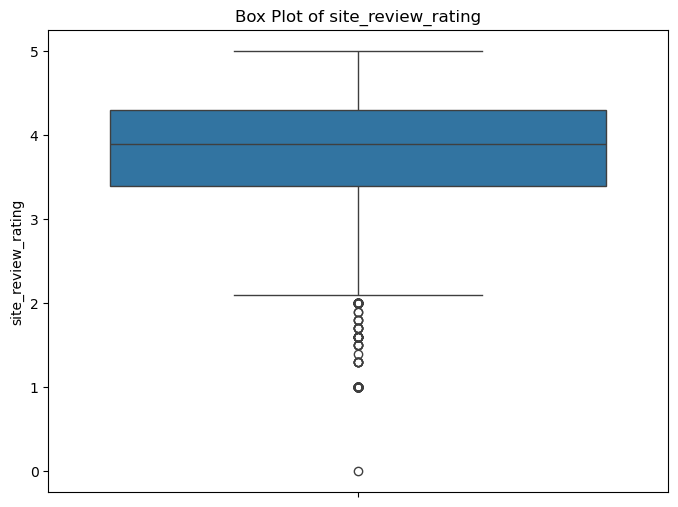

Mode of guest_recommendation: 100.0
Skewness of guest_recommendation: -1.6584343390992715
Mode of hotel_star_rating: 0
Skewness of hotel_star_rating: 0.6573752813458127
Mode of image_count: 7
Skewness of image_count: 2.3619786261529567
Mode of latitude: 9.4980667
Skewness of latitude: 0.2469297995667891
Mode of longitude: 76.3388484
Skewness of longitude: 0.007922940250984752
Mode of room_count: 10
Skewness of room_count: 56.54139480189614
Mode of site_review_count: 1.0
Skewness of site_review_count: 7.789998704307302
Mode of site_review_rating: 4.0
Skewness of site_review_rating: -1.2895862521472


In [14]:

# Load the dataset
df = pd.read_csv("goibibo_com_travel_sample.csv")

# Summary statistics for numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns
summary_stats = df[numerical_cols].describe()
print(summary_stats)

# Frequency distribution for categorical columns
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    print(f"Frequency distribution for {col}:")
    print(df[col].value_counts())

# Histograms and box plots for numerical columns
for col in numerical_cols:
    plt.figure(figsize=(8,6))
    sns.histplot(df[col], kde=True)
    plt.title(f"Histogram of {col}")
    plt.show()

    plt.figure(figsize=(8,6))
    sns.boxplot(df[col])
    plt.title(f"Box Plot of {col}")
    plt.show()

# Additional metrics
for col in numerical_cols:
    mode = df[col].mode().iloc[0]
    print(f"Mode of {col}: {mode}")
    
    skewness = df[col].skew()
    print(f"Skewness of {col}: {skewness}")


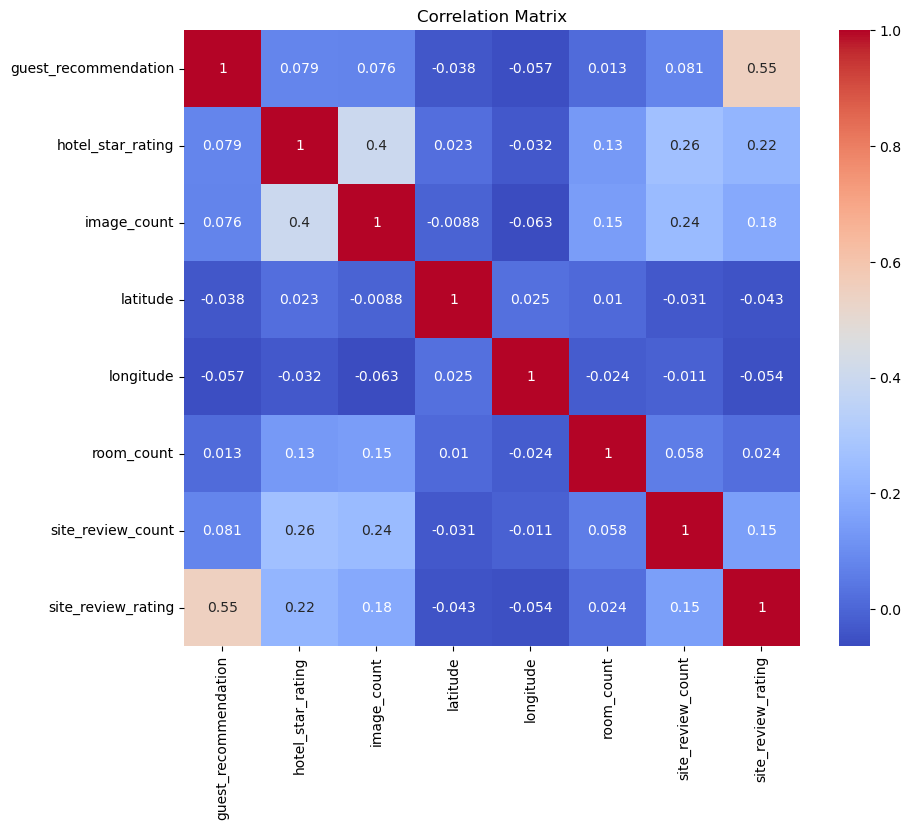

In [15]:
#BIVARIATE ANALYSIS

# Select numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Calculate correlation matrix
corr_matrix = df[numerical_cols].corr()

# Visualize correlation matrix
plt.figure(figsize=(10,8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', square=True)
plt.title("Correlation Matrix")
plt.show()


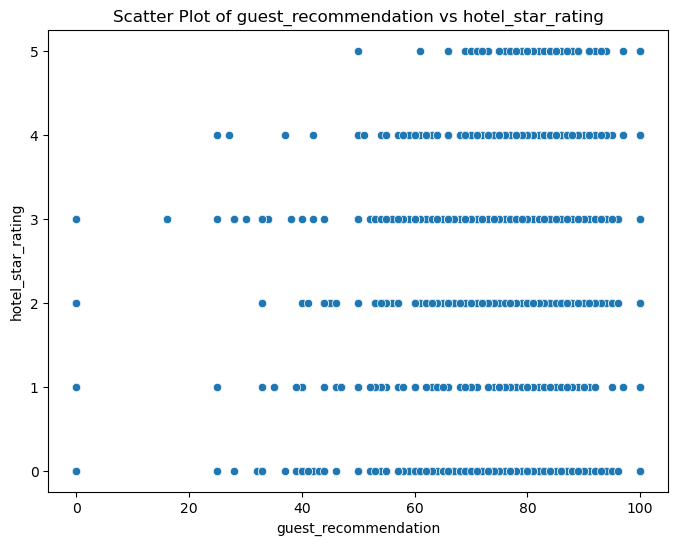

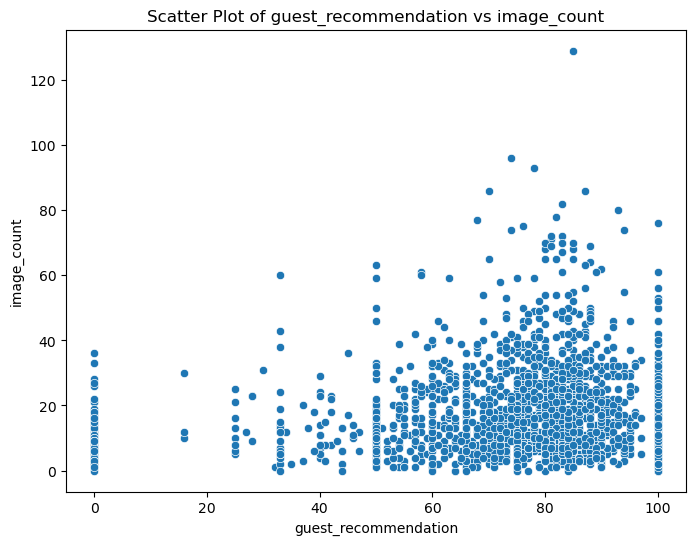

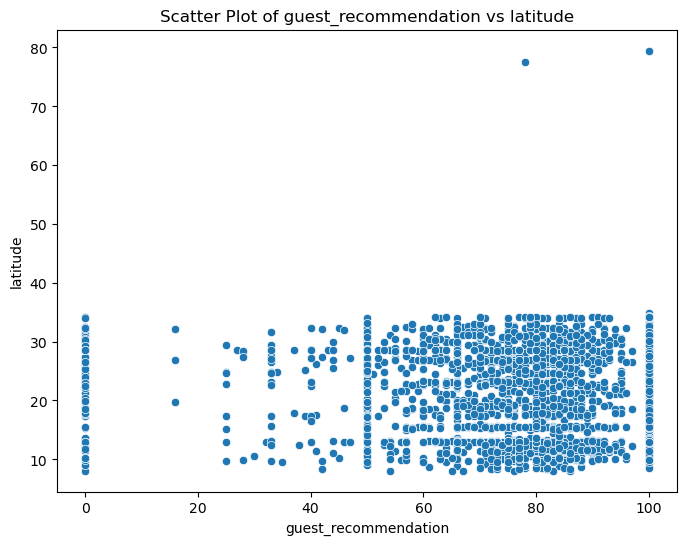

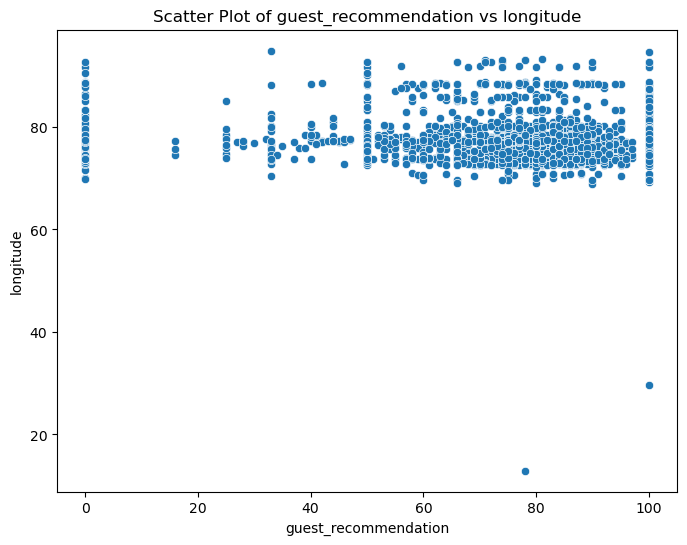

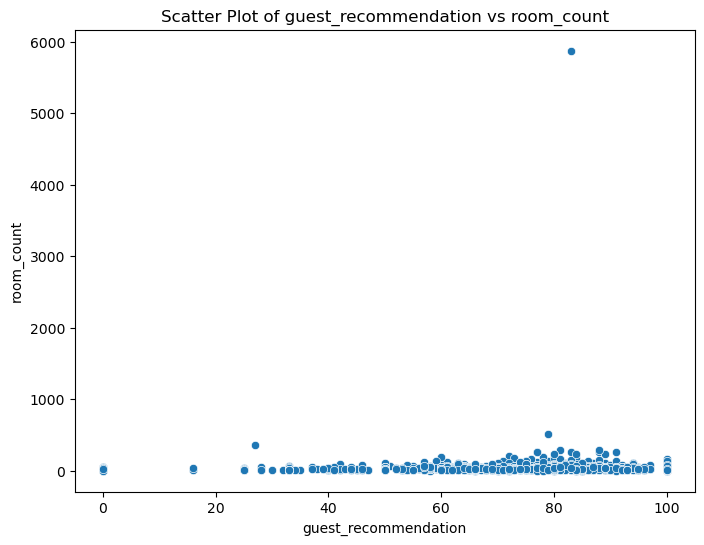

...

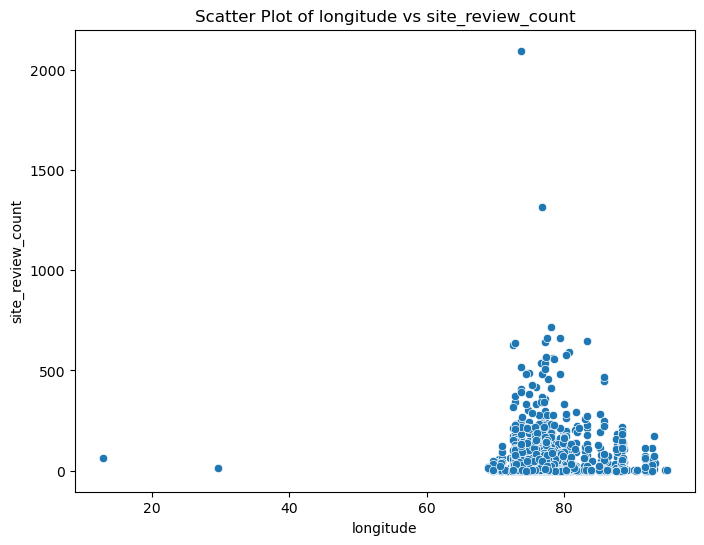

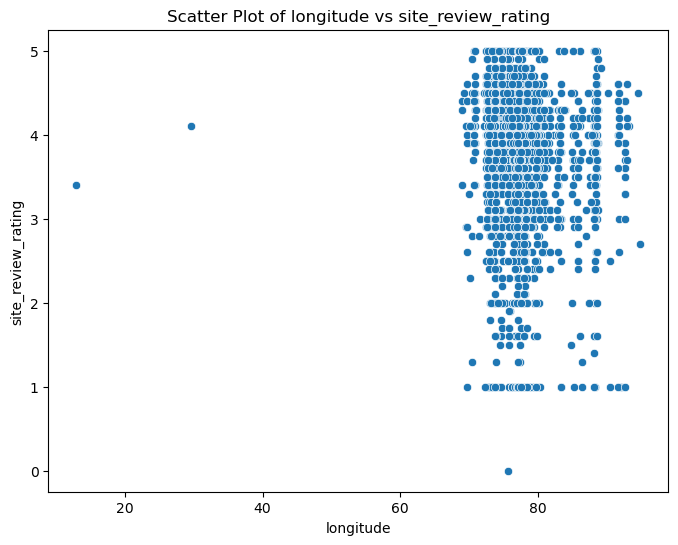

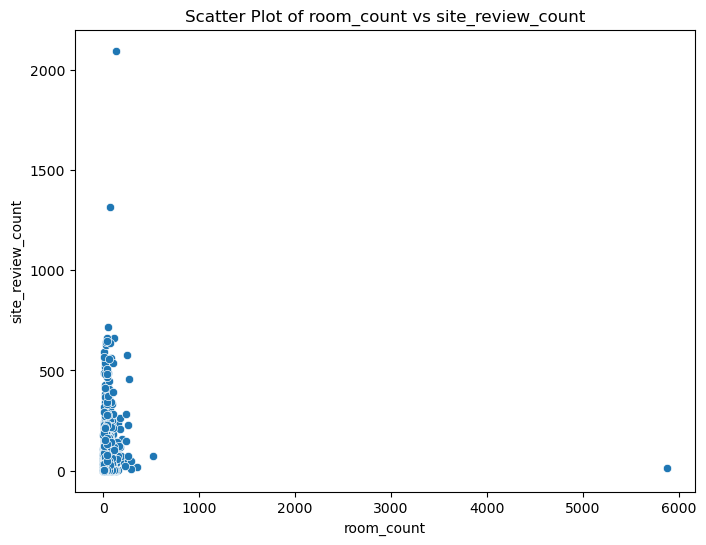

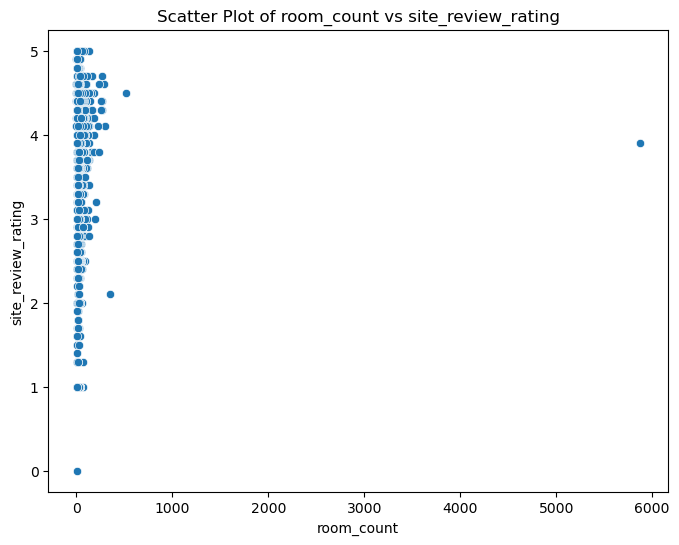

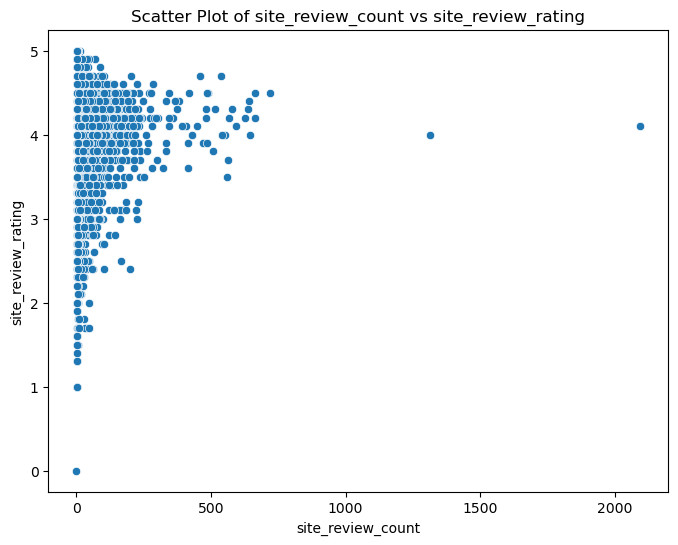

In [16]:
# Loop through numerical columns for scatter plots
for i, col1 in enumerate(numerical_cols):
    for col2 in numerical_cols[i+1:]:
        plt.figure(figsize=(8,6))
        sns.scatterplot(x=df[col1], y=df[col2])
        plt.title(f"Scatter Plot of {col1} vs {col2}")
        plt.show()


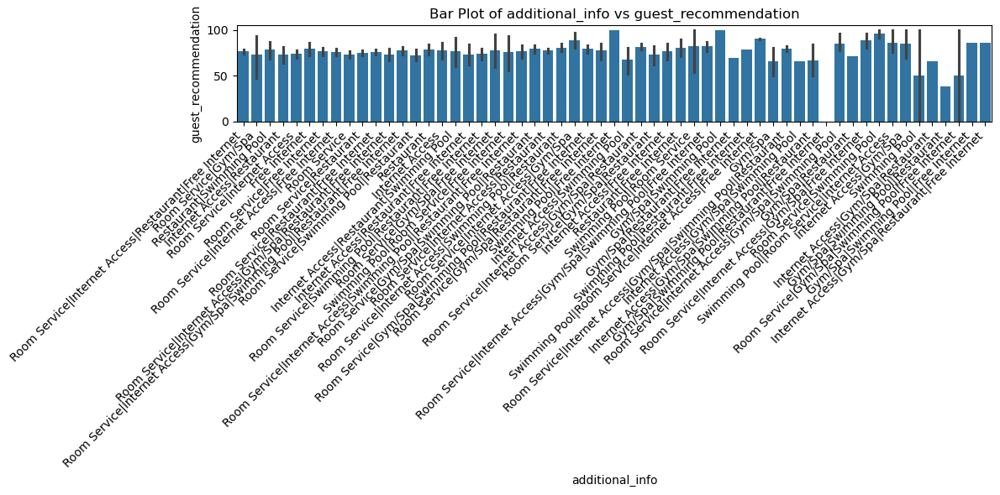

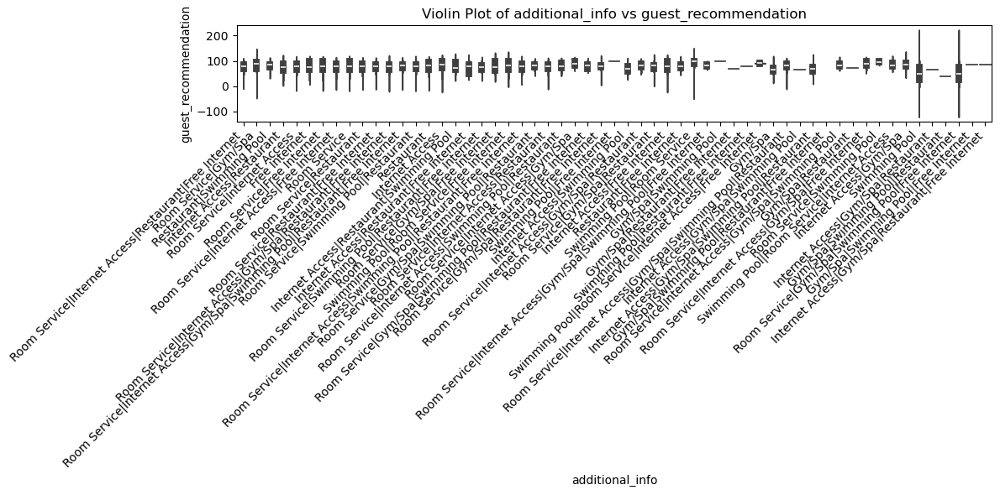

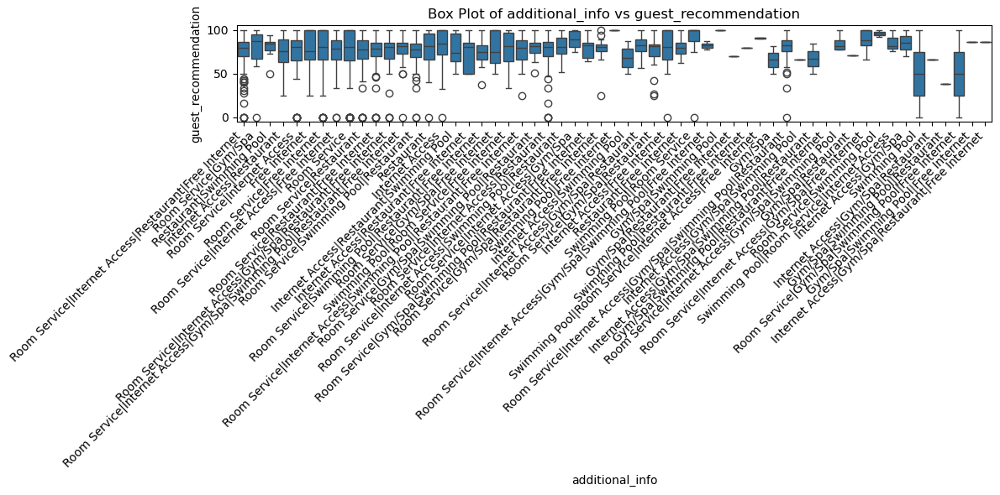

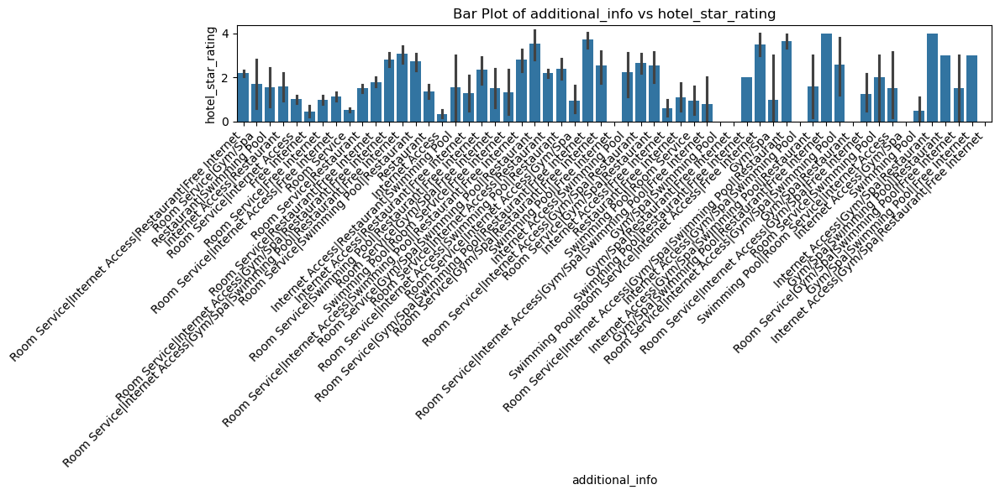

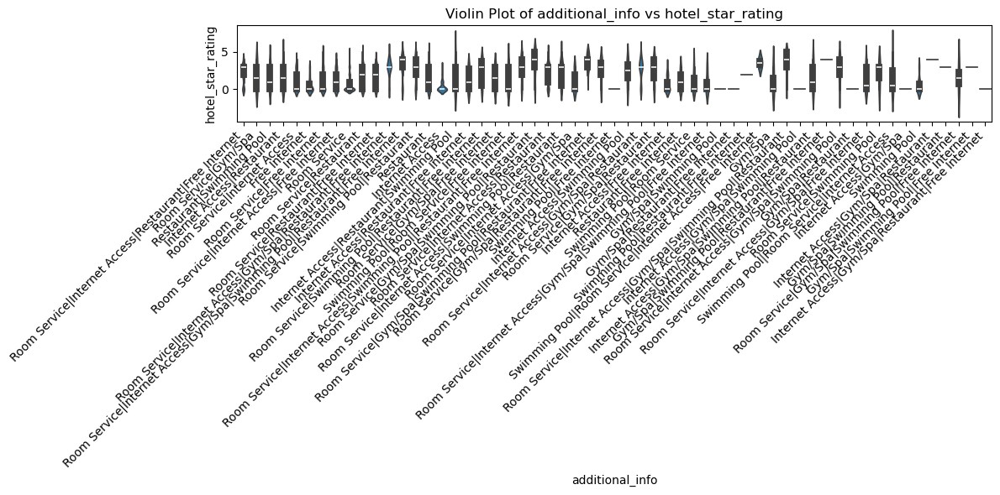

...

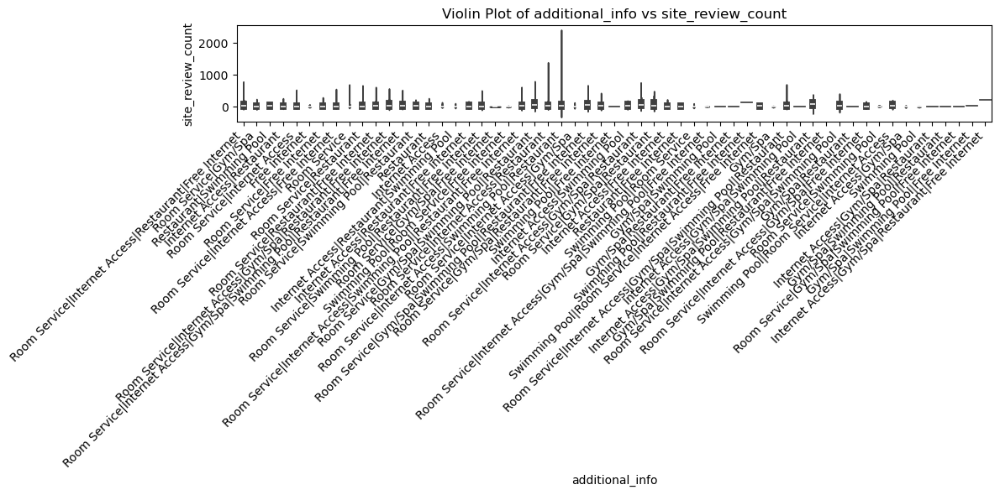

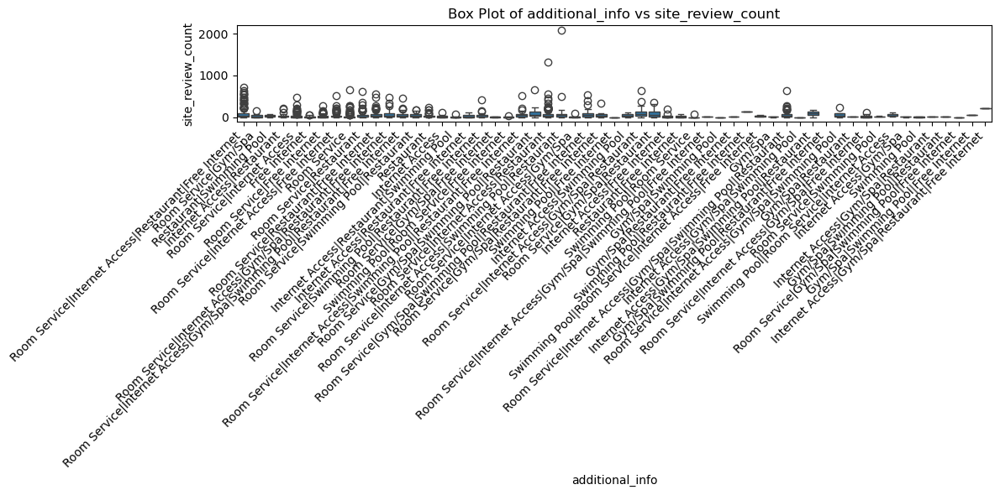

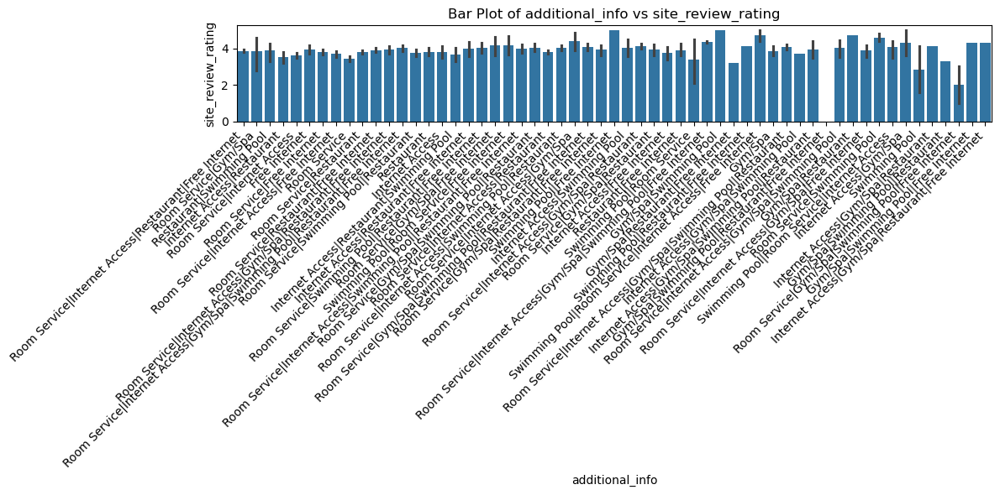

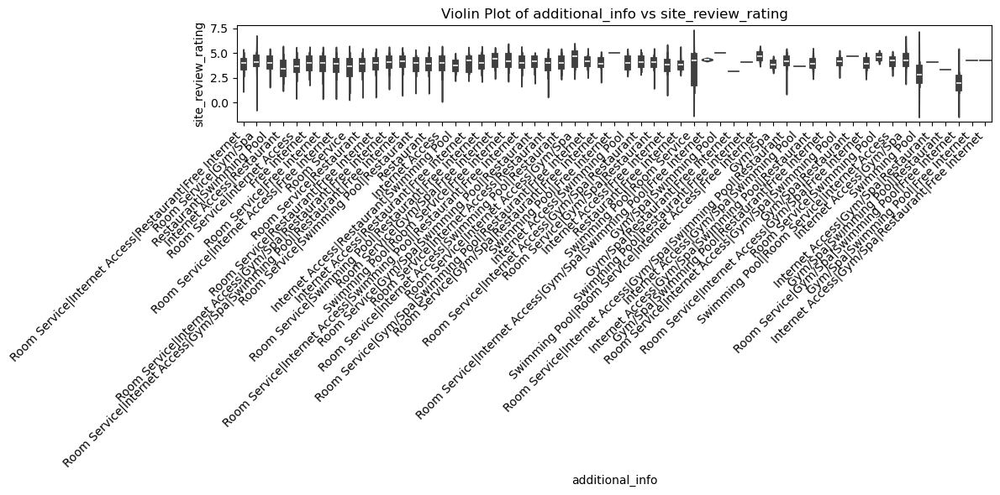

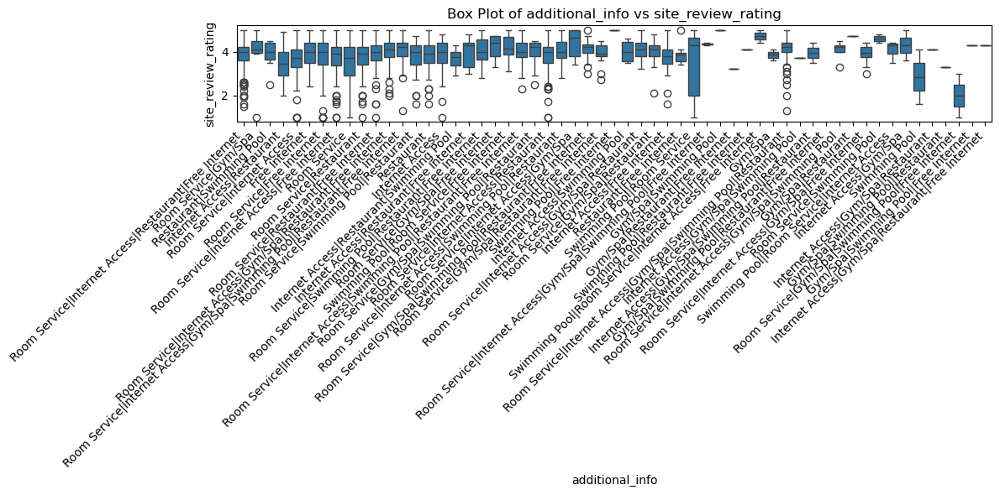

C:\Users\spriy\AppData\Local\Temp\ipykernel_10340\1308143463.py:12: UserWarning: Glyph 9 (	) missing from font(s) DejaVu Sans.
  plt.tight_layout()  # Adjust layout
C:\Users\spriy\AppData\Local\Temp\ipykernel_10340\1308143463.py:12: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()  # Adjust layout


In [ ]:


# Select categorical and numerical columns
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(include=['number']).columns  # Ensure numerical cols are selected

# Loop through categorical and numerical columns
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(12, 6))  # Increase figure size
        sns.barplot(x=df[cat_col], y=df[num_col], dodge=False)
        plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels
        plt.title(f"Bar Plot of {cat_col} vs {num_col}")
        plt.tight_layout()  # Adjust layout
        plt.show()

        plt.figure(figsize=(12, 6))
        sns.violinplot(x=df[cat_col], y=df[num_col])
        plt.xticks(rotation=45, ha='right')
        plt.title(f"Violin Plot of {cat_col} vs {num_col}")
        plt.tight_layout()
        plt.show()

        plt.figure(figsize=(12, 6))
        sns.boxplot(x=df[cat_col], y=df[num_col])
        plt.xticks(rotation=45, ha='right')
        plt.title(f"Box Plot of {cat_col} vs {num_col}")
        plt.tight_layout()
        plt.show()


In [ ]:
#MULTIVARIATE ANALYSIS
# Select numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Sample data 
df_sample = df[numerical_cols].sample(n=1000, random_state=42) if len(df) > 1000 else df[numerical_cols]

# Pair plot 
sns.pairplot(df_sample, plot_kws={'s': 10, 'alpha': 0.5})  
plt.show()


In [ ]:

# Select numerical columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Sample data for efficiency (if dataset has more than 1000 rows)
df_sample = df[numerical_cols].sample(n=1000, random_state=42) if len(df) > 1000 else df[numerical_cols]

# Compute correlation matrix
corr_matrix = df_sample.corr()

# Plot optimized heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', 
            square=True, vmin=-1, vmax=1, linewidths=0.5, annot_kws={'size': 8})

plt.title("Correlation Matrix", fontsize=14)
plt.tight_layout()  # Prevents overlap
plt.show()





In [ ]:


# Select categorical and numerical columns
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns

# Sample data if dataset is too large
df_sample = df.sample(n=1000, random_state=42) if len(df) > 1000 else df

# Loop through categorical and numerical columns
for cat_col in categorical_cols:
    for num_col1 in numerical_cols:
        for num_col2 in numerical_cols:
            if num_col1 != num_col2:
                fig, axes = plt.subplots(1, 3, figsize=(20, 6))

                # Bar plot
                sns.barplot(x=df_sample[cat_col], y=df_sample[num_col1], hue=df_sample[num_col2], ax=axes[0])
                axes[0].set_title(f"Bar Plot: {cat_col} vs {num_col1} by {num_col2}", fontsize=14)
                axes[0].tick_params(axis='x', rotation=45, labelsize=10)

                # Violin plot
                sns.violinplot(x=df_sample[cat_col], y=df_sample[num_col1], hue=df_sample[num_col2], ax=axes[1])
                axes[1].set_title(f"Violin Plot: {cat_col} vs {num_col1} by {num_col2}", fontsize=14)
                axes[1].tick_params(axis='x', rotation=45, labelsize=10)

                # Box plot
                sns.boxplot(x=df_sample[cat_col], y=df_sample[num_col1], hue=df_sample[num_col2], ax=axes[2])
                axes[2].set_title(f"Box Plot: {cat_col} vs {num_col1} by {num_col2}", fontsize=14)
                axes[2].tick_params(axis='x', rotation=45, labelsize=10)

                plt.tight_layout()  # Ensures labels don’t overlap
                plt.show()



In [ ]:
#ANALYSIS IS DONE